# The NYC 311 Complaint analysis

Here we seek to answer several questions regarding complaints of New Yorkers over the time period 2010-2020.  New Yorkers certainly have a lot to complain about, and the public data provides us with data to review.  I seek to answer the following quesitons

### 1. Which type of complaint should the Department of Housing Preservation and Development of New York City focus on first?
#### Heat/hot water
This is clearly the complaint that recieves the most calls.  

### 2. Should the Department of Housing Preservation and Development of New York City focus on any particular set of boroughs, ZIP codes, or street (where the complaints are severe) for the specific type of complaints you identified in response to Question 1?
At the borough level, the Bronx.  At the zip code level, 11226.  At the street level grand concourse takes the cake.  

### 3. Does the Complaint Type that you identified in response to question 1 have an obvious relationship with any particular characteristic or characteristics of the houses or buildings?
Correlation between building characteristics and complaint types.  It may be useful to segment locations and building ages, number of floors, etc.

### 4. Can a predictive model be built for a future prediction of the possibility of complaints of the most common type?
This will use time series analysis on the complaint and building groups to predict new complaints.

### 5. Given the resources available to NYC DHPD, how can the department most effectively resolve complaints?
For this I will build a simulation model. This will consider the costs of resolving a problem, both in terms of time and resources.  The goal will be an efficient global resolution of complaints.


In [1]:
#Import modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#!pip install folium
import folium
#!pip install plotly
import plotly
import pyproj
import seaborn as sns
import matplotlib.patches as mpatches

In [177]:
#Injest data  WILL BE REVISITING TO UPDATE FROM API
filename = "C:/Users/cwl21/Downloads/311_Service_Requests_from_2010_to_Present_min.csv"
df=pd.read_csv(filename)

#hashed out until needed

#SI=pd.read_csv("C:/Users/cwl21/Downloads/nyc_pluto_18v1/PLUTO_for_WEB/SI_18v1.csv")
#QN=pd.read_csv("C:/Users/cwl21/Downloads/nyc_pluto_18v1/PLUTO_for_WEB/QN_18v1.csv")
#BK=pd.read_csv("C:/Users/cwl21/Downloads/nyc_pluto_18v1/PLUTO_for_WEB/BK_18v1.csv")
#BX=pd.read_csv("C:/Users/cwl21/Downloads/nyc_pluto_18v1/PLUTO_for_WEB/BX_18v1.csv")
#MN=pd.read_csv("C:/Users/cwl21/Downloads/nyc_pluto_18v1/PLUTO_for_WEB/MN_18v1.csv")

C:\Users\cwl21\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning: Columns (19,20,22,23,64,65,80) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [187]:
# Cleaning up the data set

df = df.drop(['Unnamed: 0'], axis=1) # save 734.8-688.9 MB memory
df = df.drop(['Status'], axis=1) # save 688.9-643.0 MB memory
for i in df.columns:    # converts all the string data into lowercase for more uniformity
    if df[i].dtype == 'O':
        df[i] = df[i].str.lower()
df['Incident Zip'] = df['Incident Zip'].fillna(0).astype(int) # converts zip code to int

df = df.drop(['Unique Key'], axis=1)# save 643.0 - 597.1 MB memory
boroughs = set(df.Borough.unique())
#for row in df[df.Borough == 'unspecified'].index: # in case Borough was entered as City, this is fixed
#    if df.City[row] in boroughs:
#        df.Borough[row] = df.City[row]
df['Complaint Type'] = df['Complaint Type'].replace('paint - plaster', 'paint/plaster') # fixes duplicate



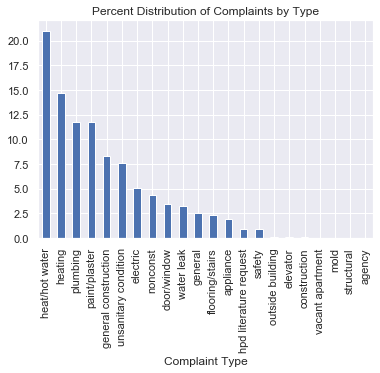

In [143]:
(100. * df.groupby('Complaint Type').count()/ df.groupby('Complaint Type').count().sum()).round(1)['Created Date'].sort_values(ascending=False).plot(kind='bar', title='Percent Distribution of Complaints by Type')

# 1. 
It is clear that heat/hot water complaints make up the bulk of all complaints.



In [146]:
df[df['Complaint Type'] == 'heat/hot water'].groupby('Borough').count()['Created Date']

Borough
bronx            410853
brooklyn         384523
manhattan        285526
queens           168318
staten island     12353
unspecified           1
Name: Created Date, dtype: int64

The Bronx takes a small lead over Brooklyn and their proximity <i>is </i> relevant, in the interest of looking deeper, let's look into zip codes.  Similar analysis will be needed for each location anyway.

In [156]:
df[df['Complaint Type'] == 'heat/hot water'].groupby('Incident Zip').count()['Created Date'].sort_values(ascending=False)[:20]

Incident Zip
11226    41786
10458    38864
10467    38110
10468    34507
10453    34241
10457    28295
10452    28118
10031    27274
10456    25660
10462    25523
11225    25194
11213    22916
10040    22214
10472    21537
10032    20624
10033    20419
10460    19956
10463    19751
11212    19260
11373    17585
Name: Created Date, dtype: int64

Oddly enough, this takes us to Brooklyn.  The next 10 or so zip codes are in the Bronx, but as before, each location will need to be analysed ultimately.  So, we will use this Brooklyn zip code

In [173]:
from folium.plugins import FastMarkerCluster
my_map = folium.Map(
    location=[40.6428, -73.95421], zoom_start = 14,
        prefer_canvas=True
)
# add all the point from the file to the map object using FastMarkerCluster
my_map.add_child(FastMarkerCluster(df[df['Incident Zip']==11226][['Latitude', 'Longitude']].values.tolist()))
# save the map 
#my_map.save("save_file.html")
my_map

In [176]:
df[df['Complaint Type'] == 'heat/hot water'].groupby('Street Name').count()['Created Date'].sort_values(ascending=False)[:10]

Street Name
grand concourse             22287
broadway                    15368
elmhurst avenue             11377
ocean avenue                10110
morris avenue                9727
boynton avenue               8725
st nicholas avenue           8557
amsterdam avenue             7288
dr m l king jr boulevard     6727
ocean parkway                6276
Name: Created Date, dtype: int64

Since PLUTO data is organized by borough, we'll use the borough level top compaint volume area of the Bronx for our first analysis.

In [ ]:
BX=pd.read_csv("C:/Users/cwl21/Downloads/nyc_pluto_18v1/PLUTO_for_WEB/BX_18v1.csv")

In [204]:
BX.Address = BX.Address.str.lower()
len(BX)

89854

I'll limit the data set to the buildings that a report has been called.

In [227]:
print('The new length of ' +str(len(BX[BX.Address.isin(set(bronxdf['Incident Address']))])) + " is a lot smaller!")
BX0 = BX[BX.Address.isin(set(bronxdf['Incident Address']))]        
bronxdf = df[df['Borough']=='bronx'][df['Complaint Type']=='heat/hot water']
bronxdf = bronxdf.rename(columns={"Incident Address": "Address"})


#### Using the following:
    Address, BldgArea, BldgDepth, BuiltFAR, CommFAR, FacilFAR, Lot, LotArea, LotDepth, NumBldgs, NumFloors, OfficeArea, ResArea, ResidFAR, RetailArea, YearBuilt, YearAlter1, ZipCode

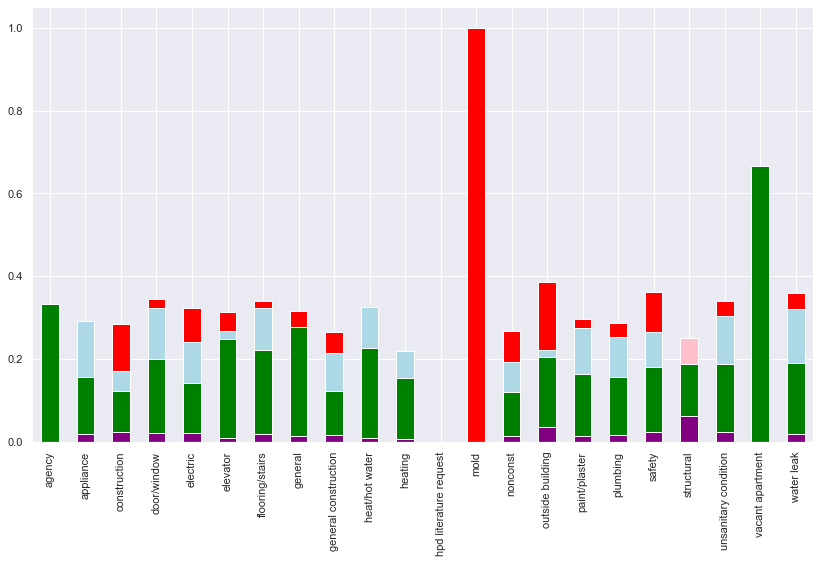

In [52]:


# set plot style: grey grid in the background:
sns.set(style="darkgrid")

# set the figure size
plt.figure(figsize=(14, 8))

total =pd.get_dummies(df['Complaint Type']).sum()
bx = pd.get_dummies(df[df['Borough']=='bronx']['Complaint Type']).sum()
bk = pd.get_dummies(df[df['Borough']=='brooklyn']['Complaint Type']).sum()
qn = pd.get_dummies(df[df['Borough']=='queens']['Complaint Type']).sum()
mn = pd.get_dummies(df[df['Borough']=='manhattan']['Complaint Type']).sum()
si = pd.get_dummies(df[df['Borough']=='staten island']['Complaint Type']).sum()

#total.plot.bar()
(bk/total).plot.bar(color='red')
(bx/total).plot.bar(color='lightblue')
(qn/total).plot.bar(color='pink')
(mn/total).plot.bar(color='green')
(si/total).plot.bar(color='purple')



In [123]:

#Using cleaner data should give a better visual
pltdf = df[df['Complaint Type']!= 'mold']
pltdf = pltdf[pltdf['Complaint Type']!= 'vacant apartment']
pltdf = pltdf[pltdf['Complaint Type']!= 'hpd literature request']


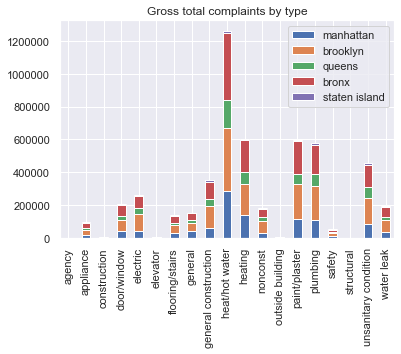

In [124]:
#pd.get_dummies(pltdf['Complaint Type']).sum().plot(kind='bar', stacked = True)
complaintdf = pd.DataFrame()
for i in df.Borough.unique():
    complaintdf[i] = pd.get_dummies(pltdf['Complaint Type'][pltdf['Borough']==i]).sum()
#complaintdf['bronx'] = pd.get_dummies(pltdf['Complaint Type'][pltdf['Borough']=='bronx']).sum()
#complaintdf['bronx'] = pd.get_dummies(pltdf['Complaint Type'][pltdf['Borough']=='bronx']).sum()
complaintdf = complaintdf.drop('unspecified', axis=1)
complaintdf.plot(kind='bar', stacked=True, title='Gross total complaints by type')

# heat/hotwater
This is clearly the top complaint in the city.  It may be beneficial to offer some incentive to property owners to spend on maintaining these sytems.  

### perform trend analysis

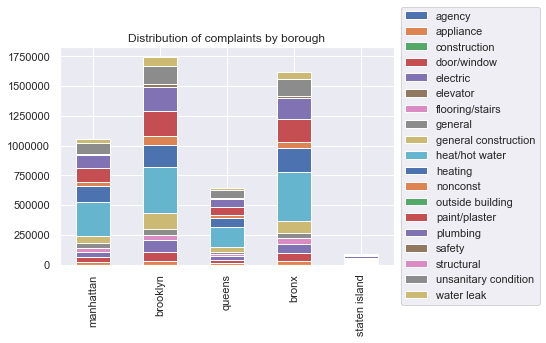

In [125]:
complaintdf.T.plot(kind='bar', stacked =True, legend=True, title='Distribution of complaints by borough').legend(loc='center right', bbox_to_anchor=(1.45, 0.5))


We see that Brooklyn and the Bronx far exceed the other boroughs in number of complaints.  The 'heat/hot water' complaint appears to be the most common, followed by 'heating','paint/plaster', 'plumbing', and 'unsanitary condition'.

This looks to be similar across boroughs.

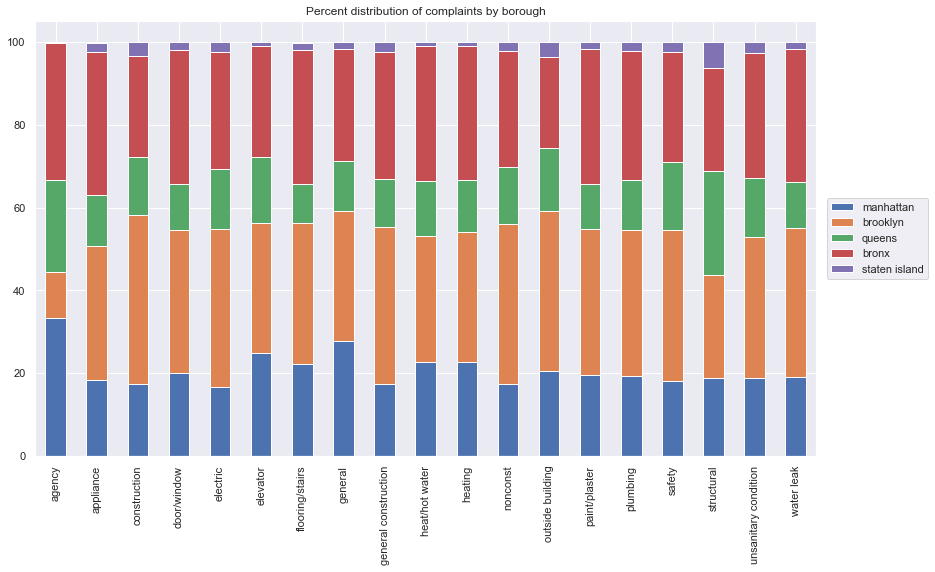

In [126]:
percdf = complaintdf.T
percdf= (100. * percdf / percdf.sum()).round(1)

percdf.T.plot(kind='bar', stacked=True, title='Percent distribution of complaints by borough', figsize = (14,8)).legend(loc='center right', bbox_to_anchor=(1.15, 0.5))